In [23]:
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import pandas as pd
import yfinance as yf 
import mplfinance as mpf
import plotly.express as px
import plotly.graph_objects as go

In [2]:
from statsmodels.tsa.stattools import coint
import numpy as np 
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint, adfuller

In [3]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd
from pykalman import KalmanFilter
import statsmodels.api as sm
plt.style.use('seaborn-whitegrid')

C:\Users\PICHAU\AppData\Local\Temp\ipykernel_1760\1006355162.py:7: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


In [4]:
datac = '2022-01-01' 
dataf = '2024-12-12'
intervalo = '1h'

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


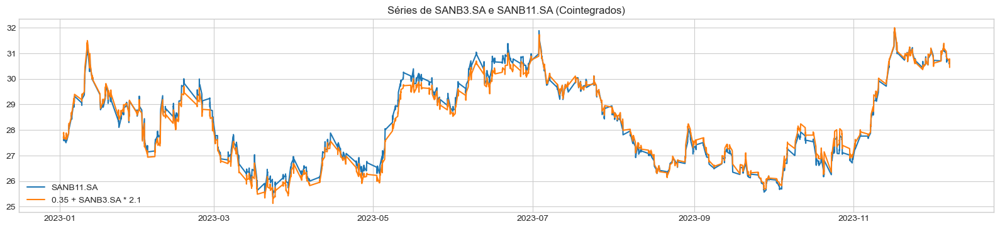

Formula do par: SANB11.SA = 0.35 + 2.1 x SANB3.SA


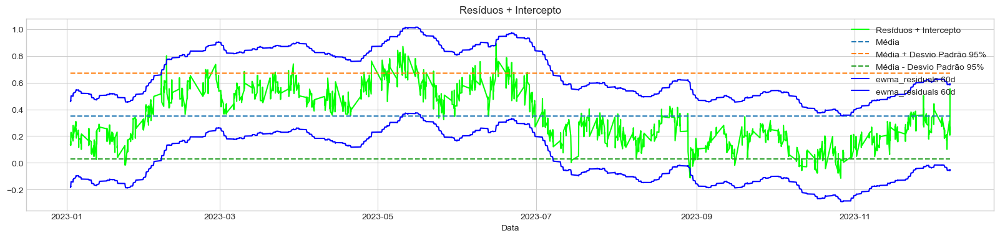

resíduo simples atual = 0.5538241100301974
spread medio  = 0.35


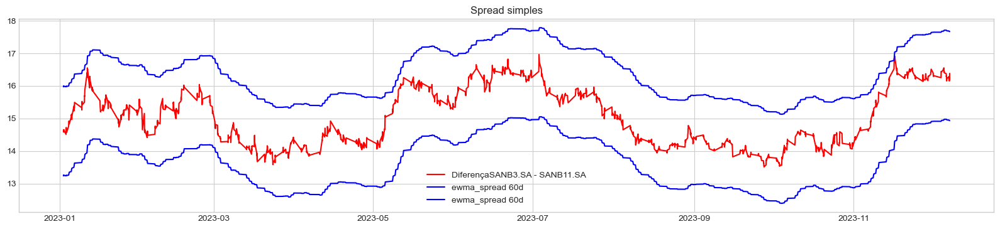

spread simples atual = 16.3799991607666
spread medio 90d = 16.33600010342068


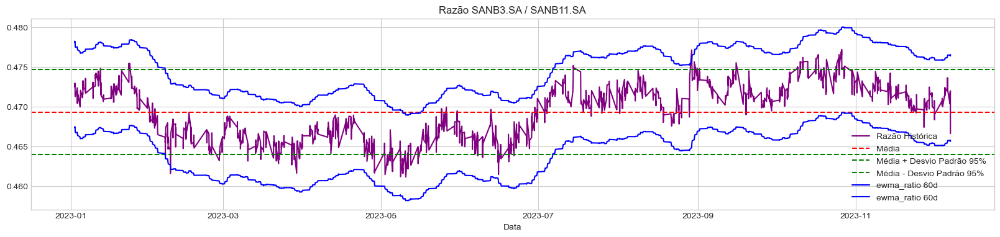

razão historica média é : 0.46932245949362694
razão historica atual é : 2023-12-07 17:00:00-03:00    0.466623
dtype: float64


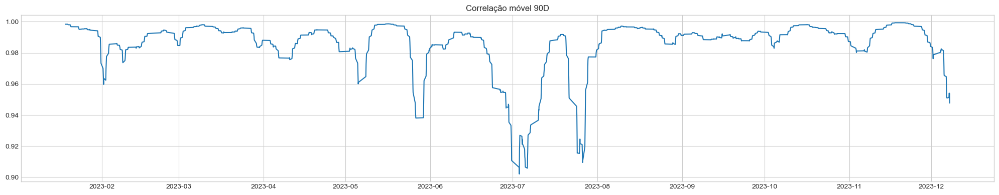

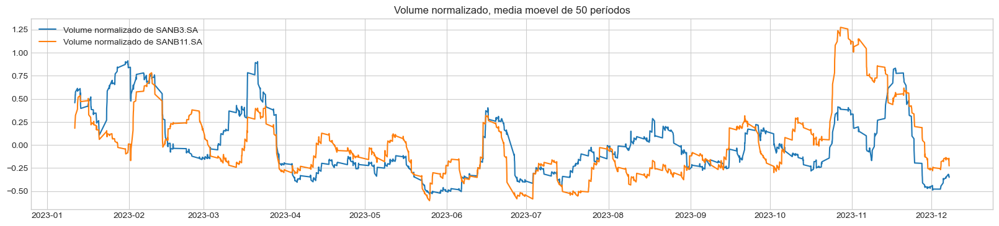

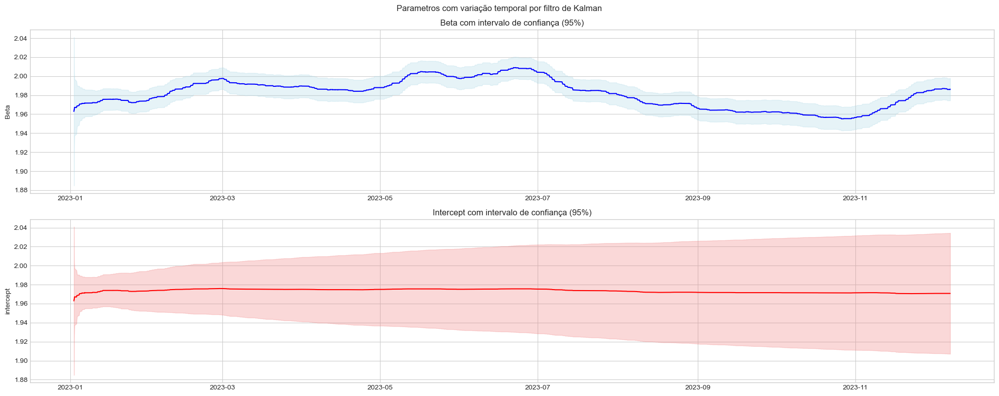

In [93]:
tickers = ['SANB3.SA', 'SANB11.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
spread_std = spread.std() * 1.56
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + spread_std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - spread_std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


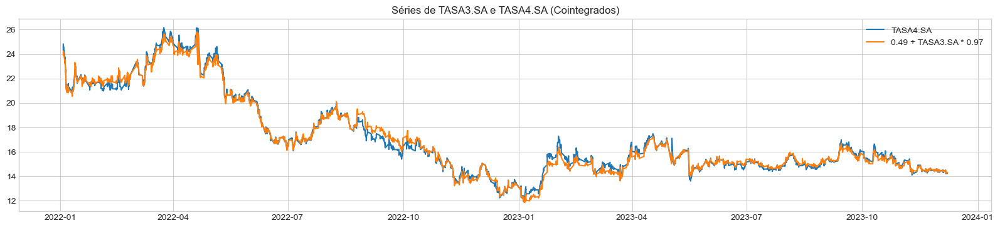

Formula do par: TASA4.SA = 0.49 + 0.97 x TASA3.SA


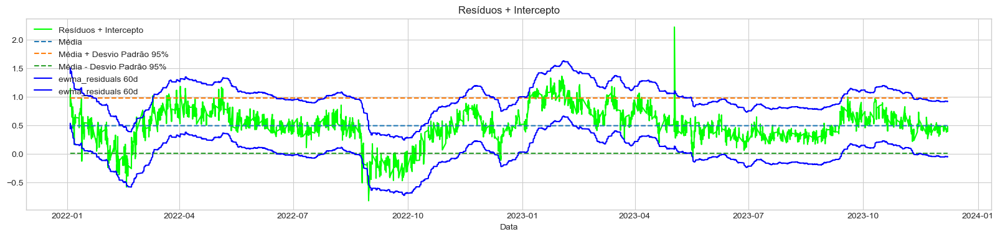

resíduo simples atual = 0.475912264834754
spread medio  = 0.49


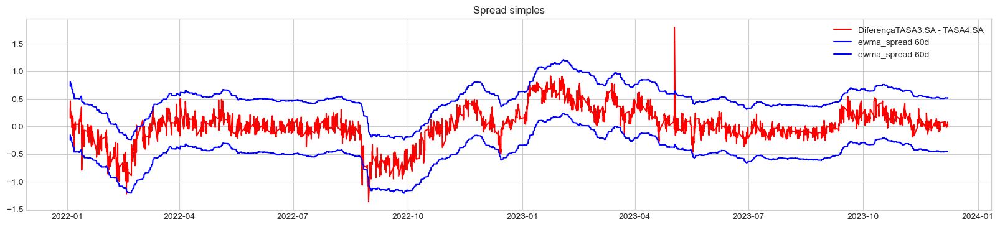

spread simples atual = 0.0800008773803711
spread medio 90d = 0.026555580563015407


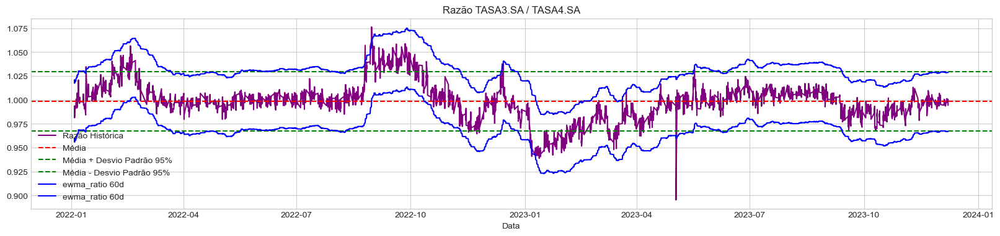

razão historica média é : 0.9984547716318145
razão historica atual é : 2023-12-07 17:00:00-03:00    0.994394
dtype: float64


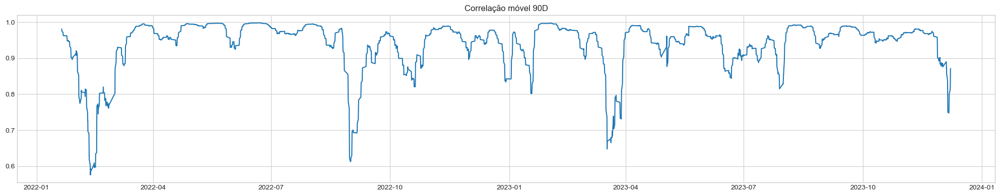

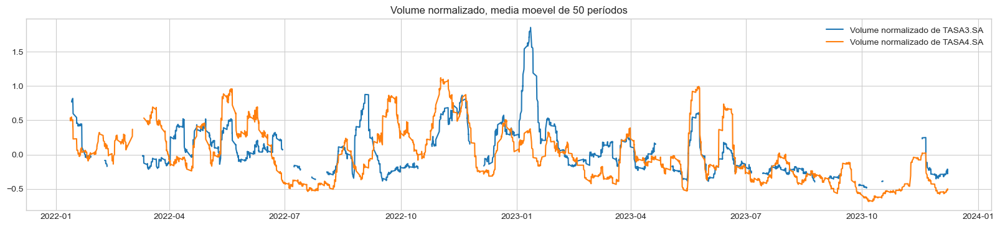

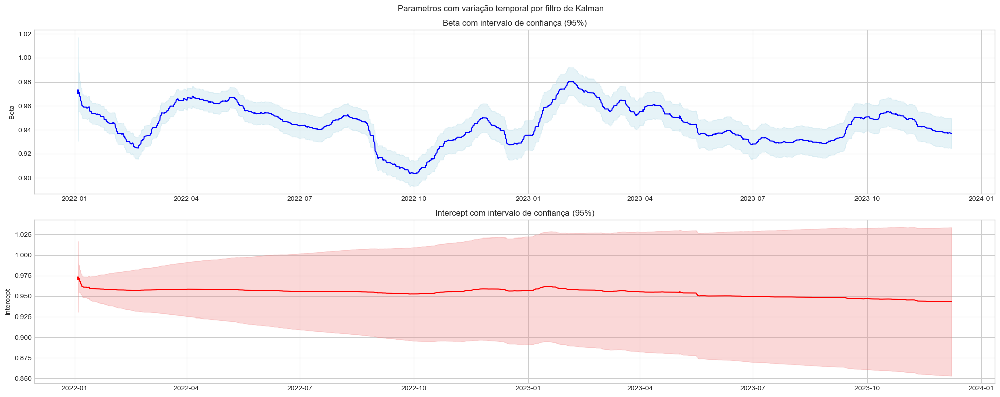

In [6]:
tickers = ['TASA3.SA', 'TASA4.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval='1h')['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


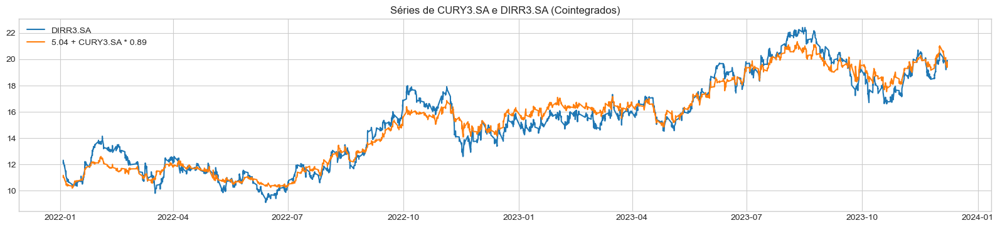

Formula do par: DIRR3.SA = 5.04 + 0.89 x CURY3.SA


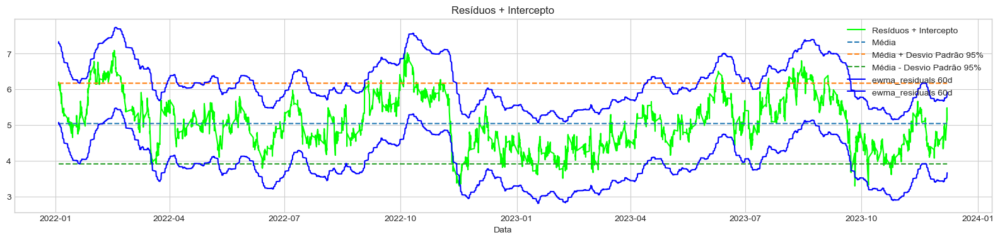

resíduo simples atual = 5.142346994987691
spread medio  = 5.04


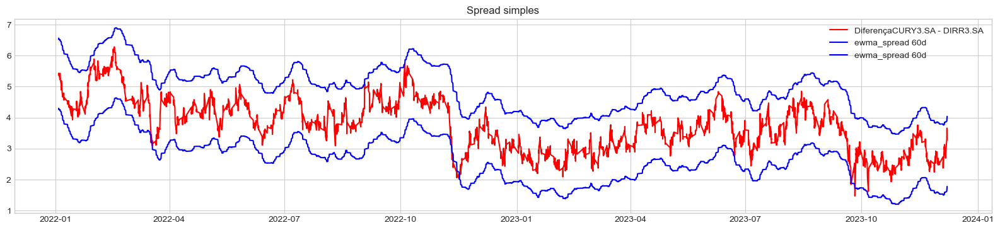

spread simples atual = 3.280000686645508
spread medio 90d = 2.703444417317708


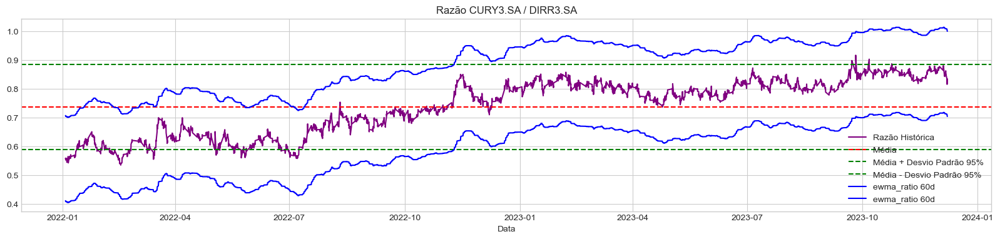

razão historica média é : 0.7371299349395578
razão historica atual é : 2023-12-07 17:00:00-03:00    0.834761
dtype: float64


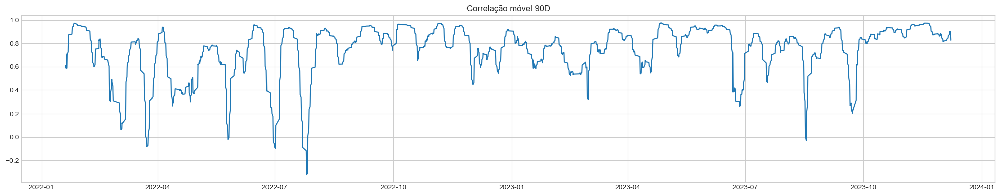

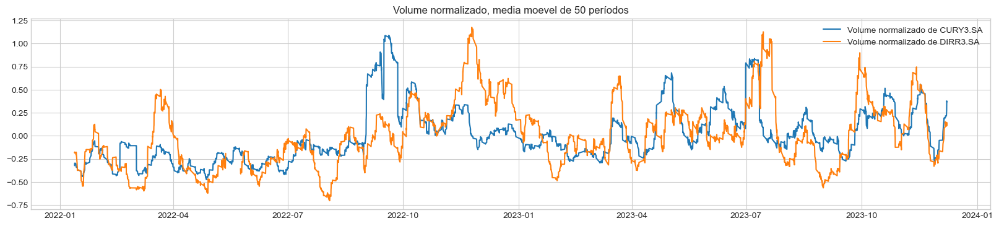

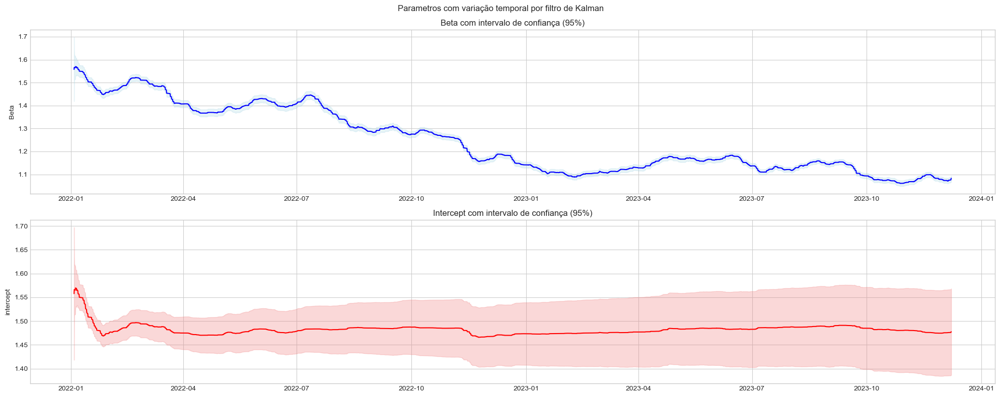

In [7]:
tickers = ['CURY3.SA', 'DIRR3.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


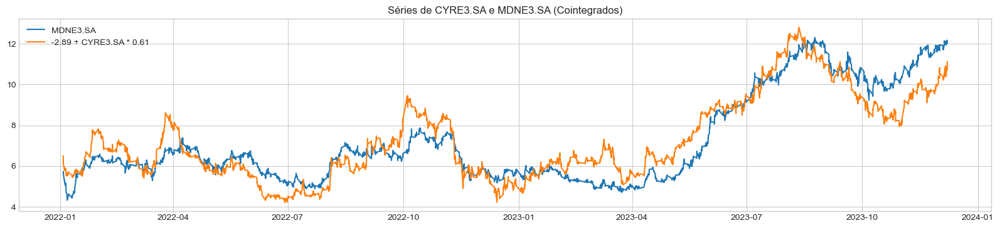

Formula do par: MDNE3.SA = -2.89 + 0.61 x CYRE3.SA


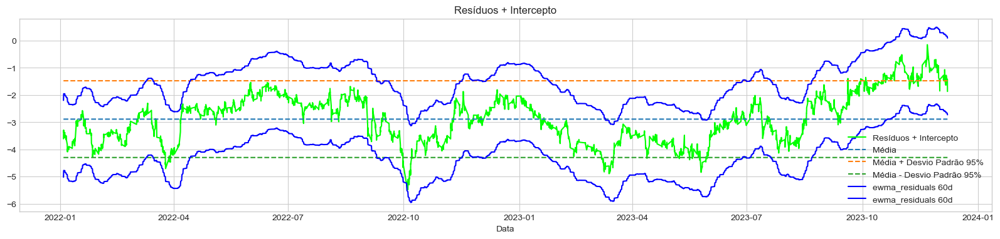

resíduo simples atual = -1.8715349447208491
spread medio  = -2.89


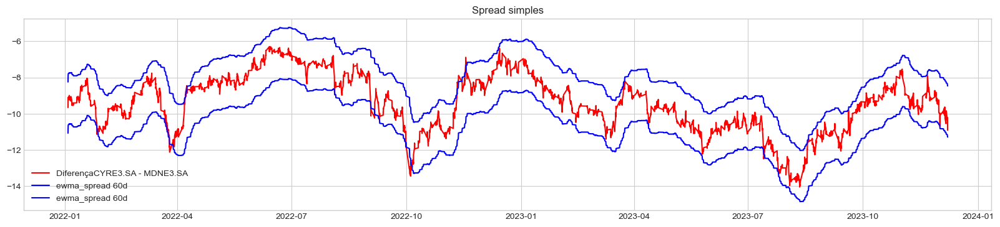

spread simples atual = -10.90999984741211
spread medio 90d = -9.464555623796251


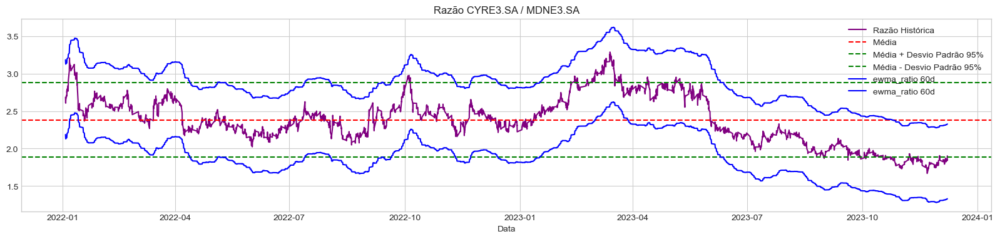

razão historica média é : 2.381325318485619
razão historica atual é : 2023-12-07 17:00:00-03:00    1.902399
dtype: float64


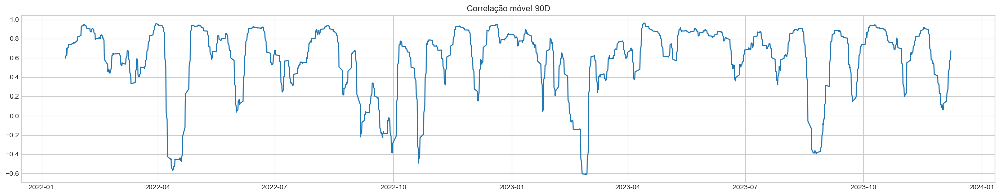

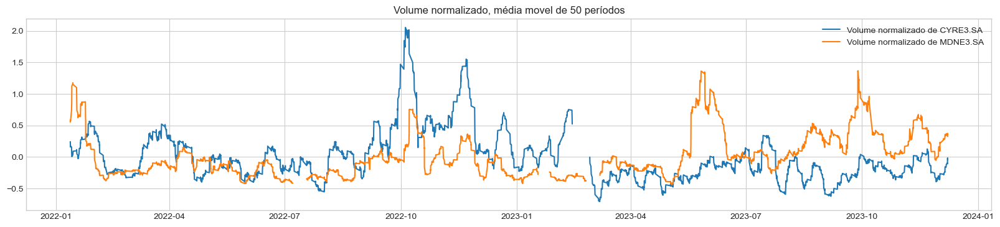

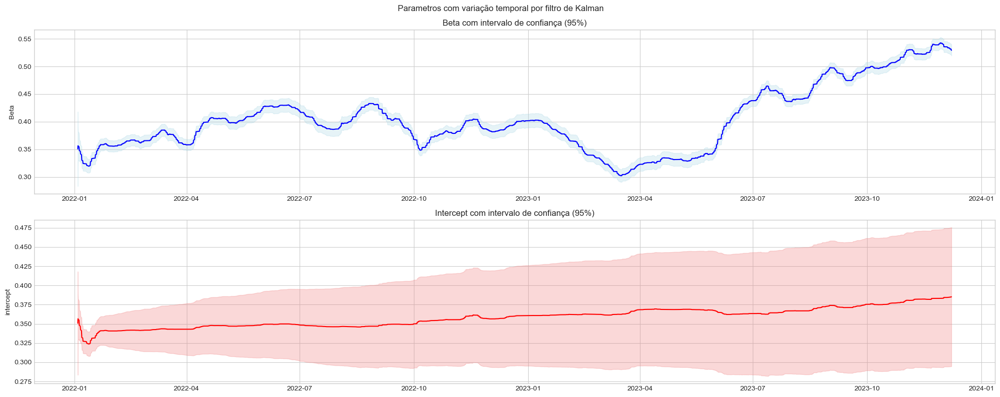

In [8]:
tickers = ['CYRE3.SA', 'MDNE3.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, média movel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


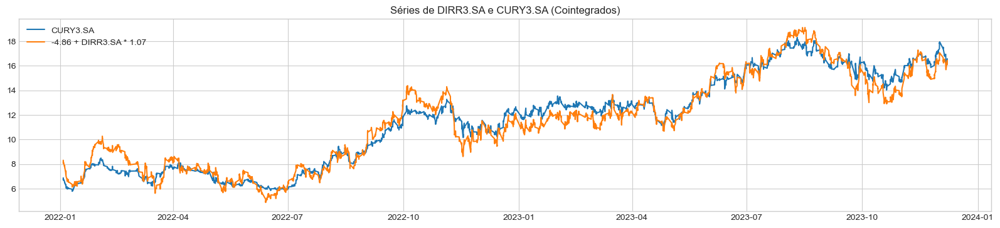

Formula do par: CURY3.SA = -4.86 + 1.07 x DIRR3.SA


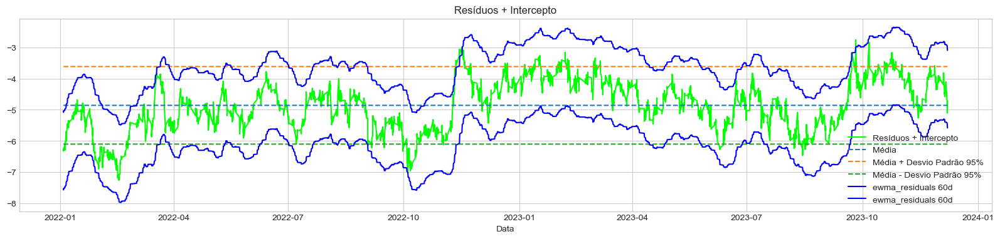

resíduo simples atual = -4.7256097603131275
spread medio  = -4.86


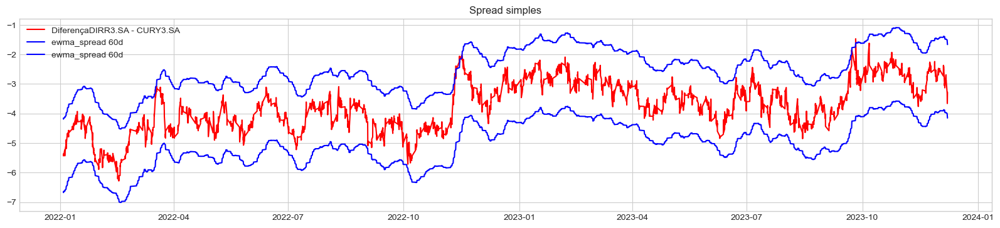

spread simples atual = -3.280000686645508
spread medio 90d = -2.703444417317708


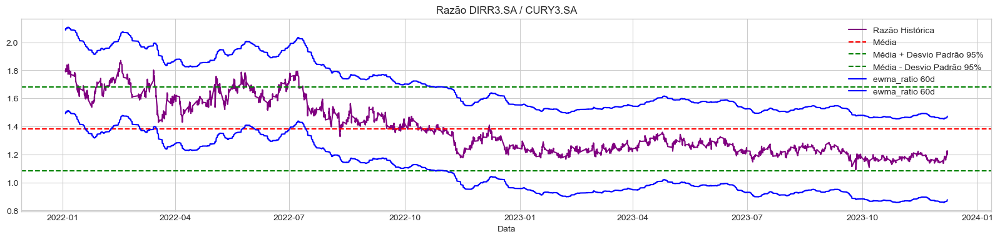

razão historica média é : 1.3810773485865153
razão historica atual é : 2023-12-07 17:00:00-03:00    1.197948
dtype: float64


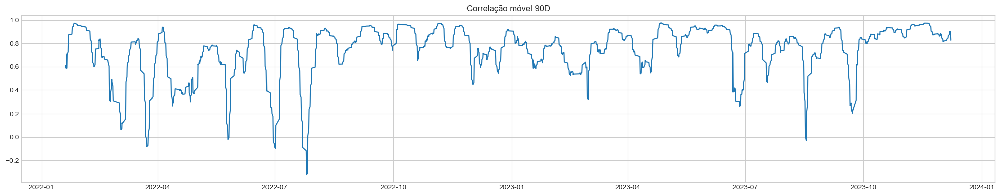

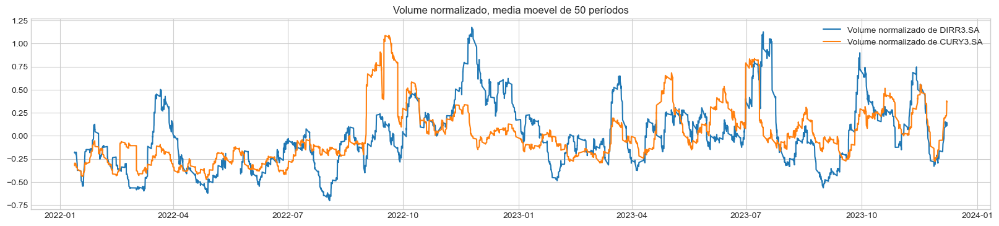

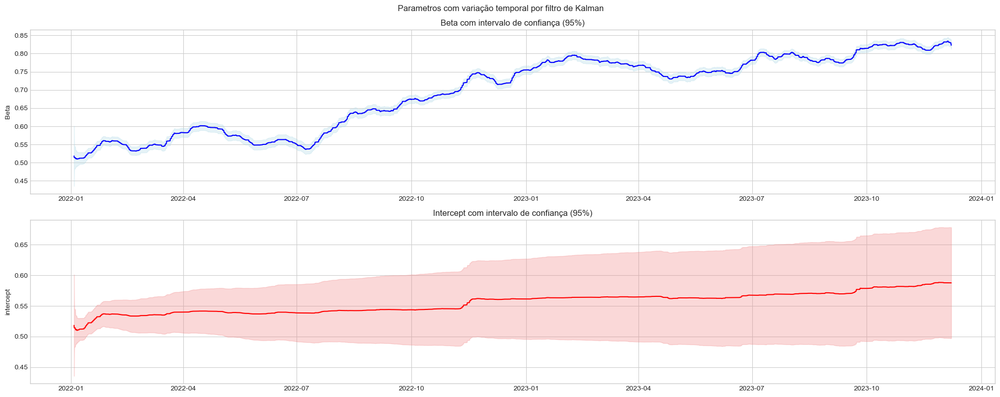

In [9]:
tickers = ['DIRR3.SA', 'CURY3.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


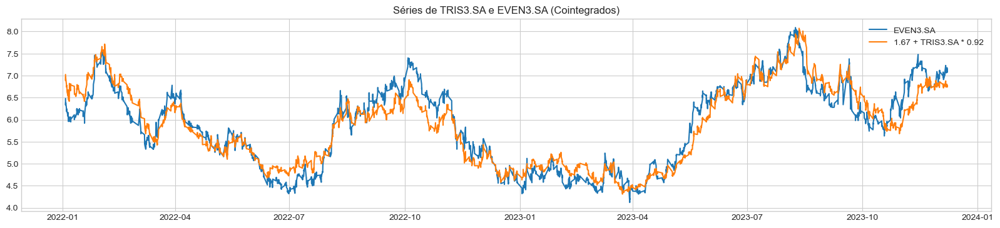

Formula do par: EVEN3.SA = 1.67 + 0.92 x TRIS3.SA


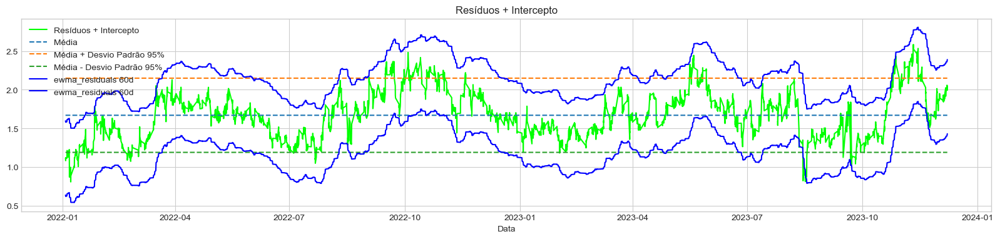

resíduo simples atual = 2.04663506470653
spread medio  = 1.67


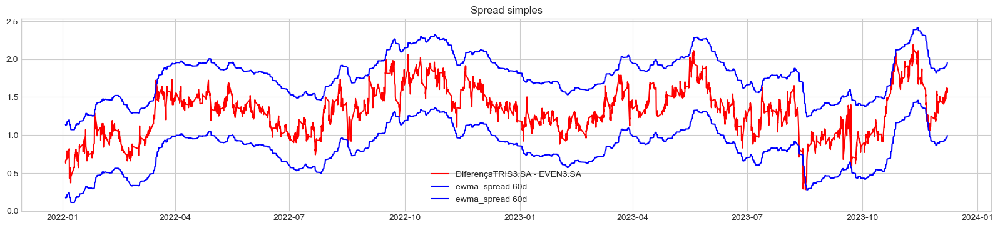

spread simples atual = 1.6100001335144043
spread medio 90d = 1.351222202512953


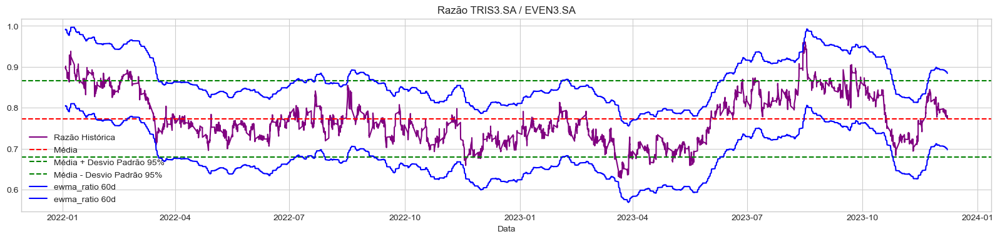

razão historica média é : 0.7722228729715769
razão historica atual é : 2023-12-07 17:00:00-03:00    0.774825
dtype: float64


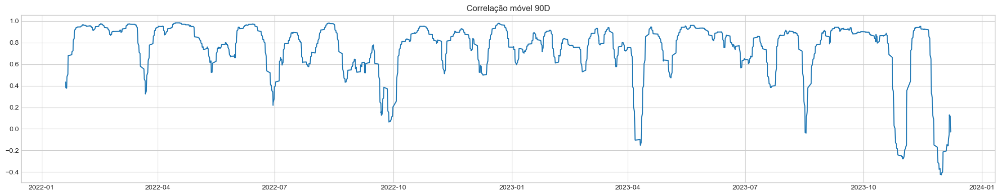

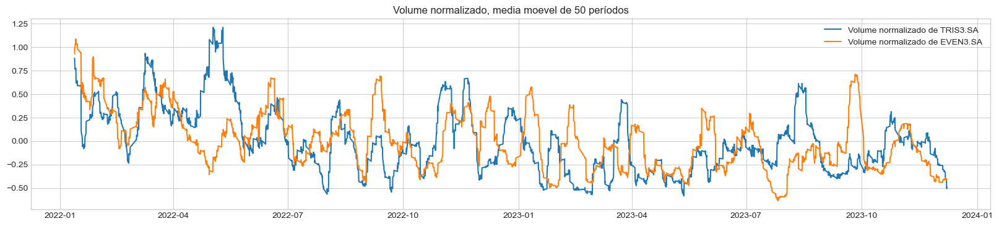

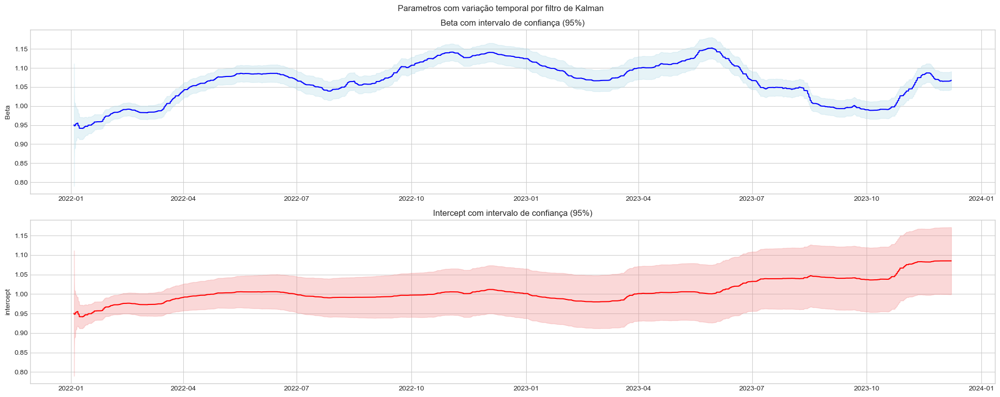

In [10]:
tickers = ['TRIS3.SA','EVEN3.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


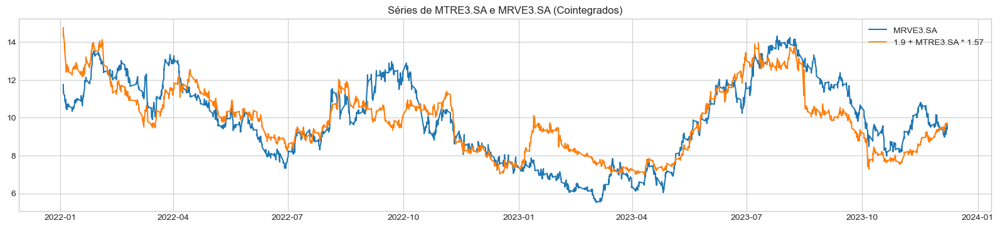

Formula do par: MRVE3.SA = 1.9 + 1.57 x MTRE3.SA


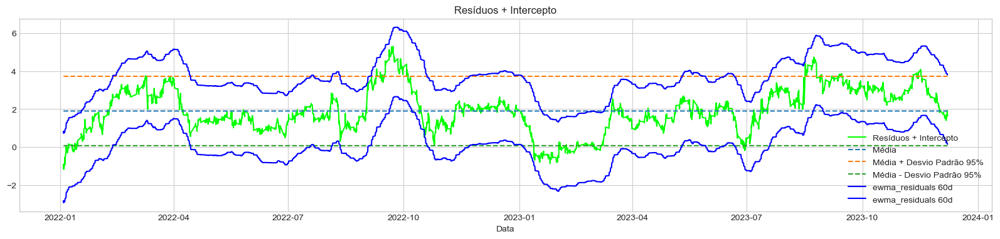

resíduo simples atual = 1.7019467384877394
spread medio  = 1.9


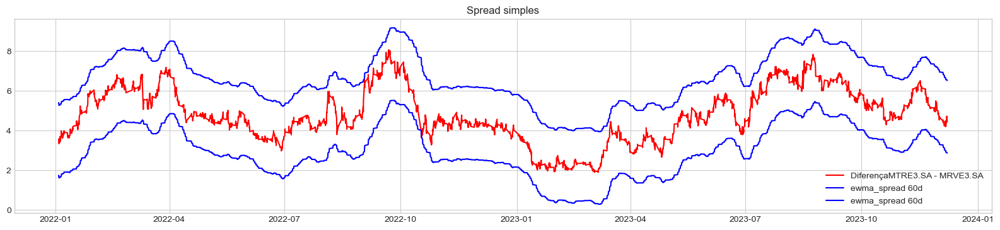

spread simples atual = 4.520000457763672
spread medio 90d = 4.910333368513319


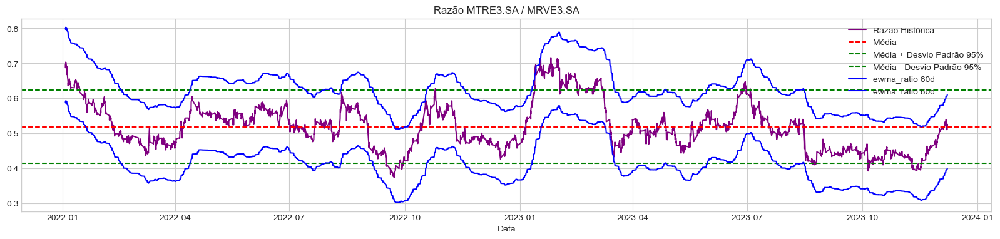

razão historica média é : 0.5189648043223083
razão historica atual é : 2023-12-07 17:00:00-03:00    0.522703
dtype: float64


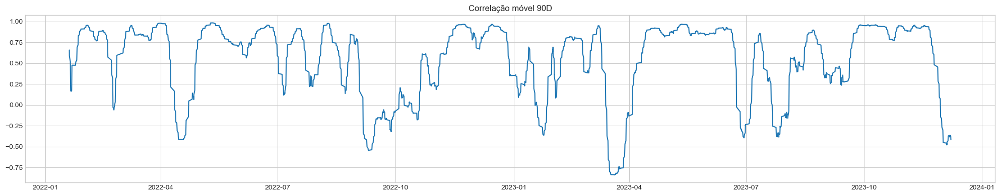

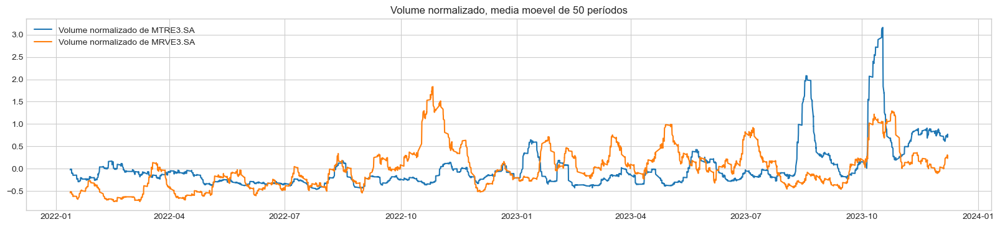

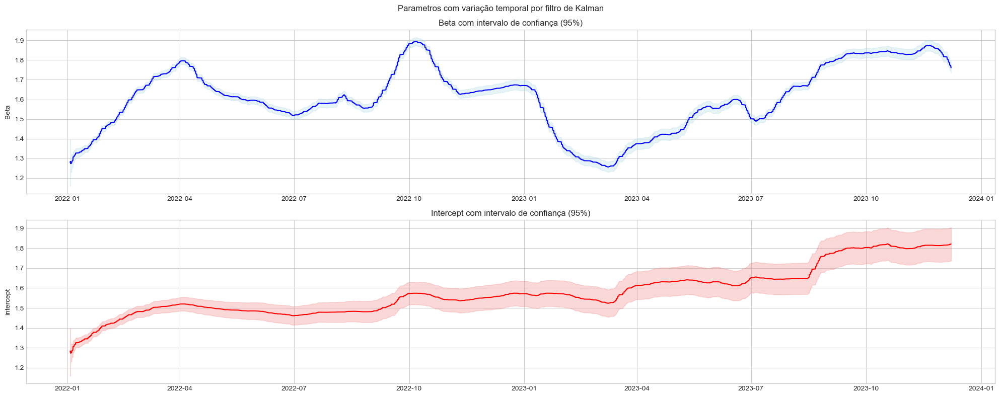

In [11]:
tickers = ['MTRE3.SA', 'MRVE3.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


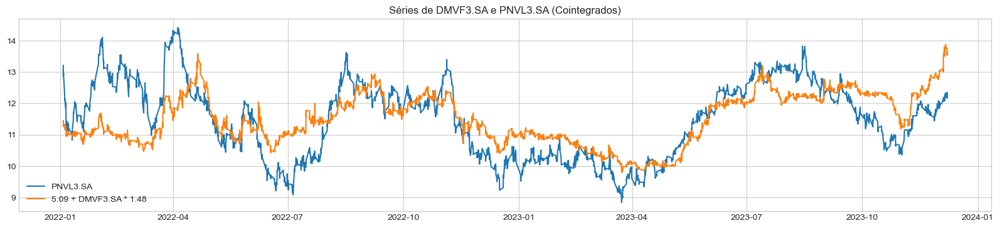

Formula do par: PNVL3.SA = 5.09 + 1.48 x DMVF3.SA


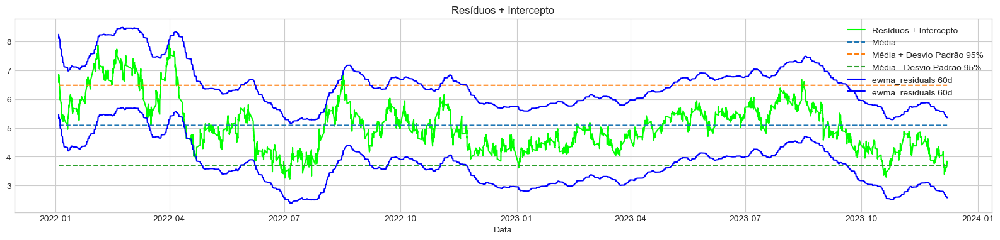

resíduo simples atual = 3.8143969884942805
spread medio  = 5.09


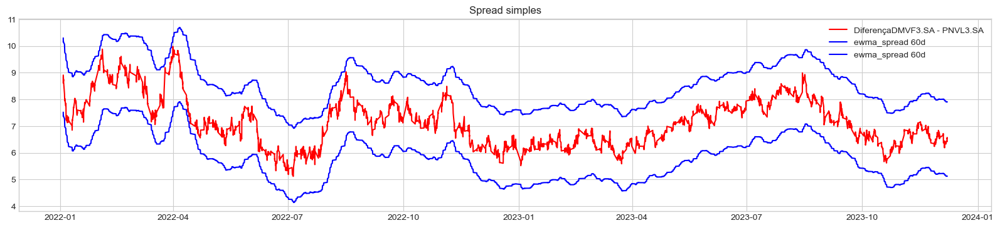

spread simples atual = 6.570000171661377
spread medio 90d = 6.5138333161671955


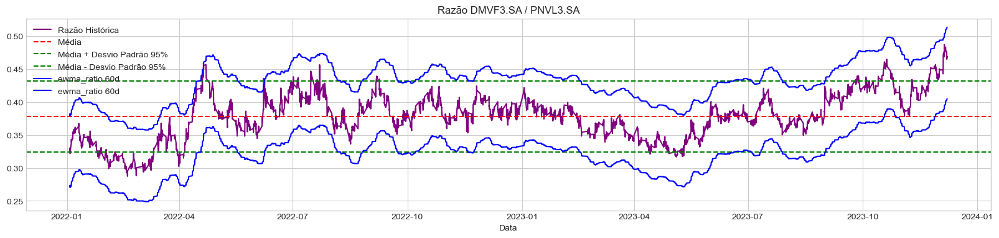

razão historica média é : 0.37802088014738516
razão historica atual é : 2023-12-07 17:00:00-03:00    0.468016
dtype: float64


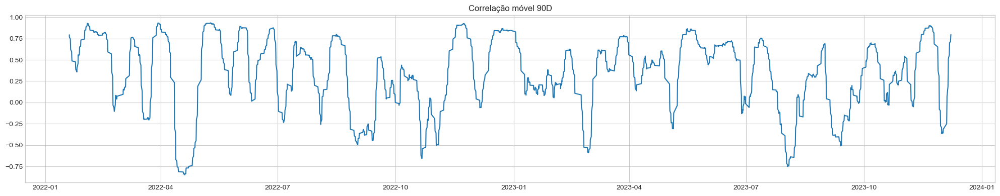

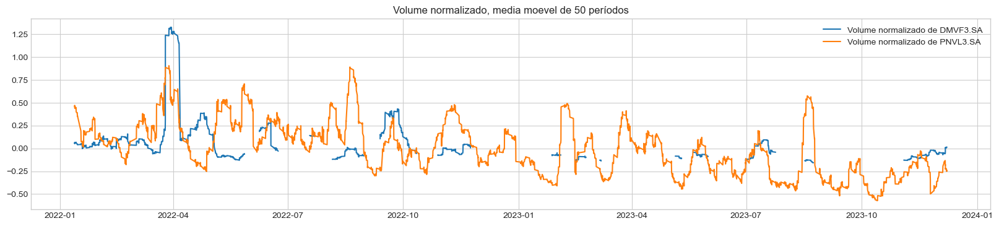

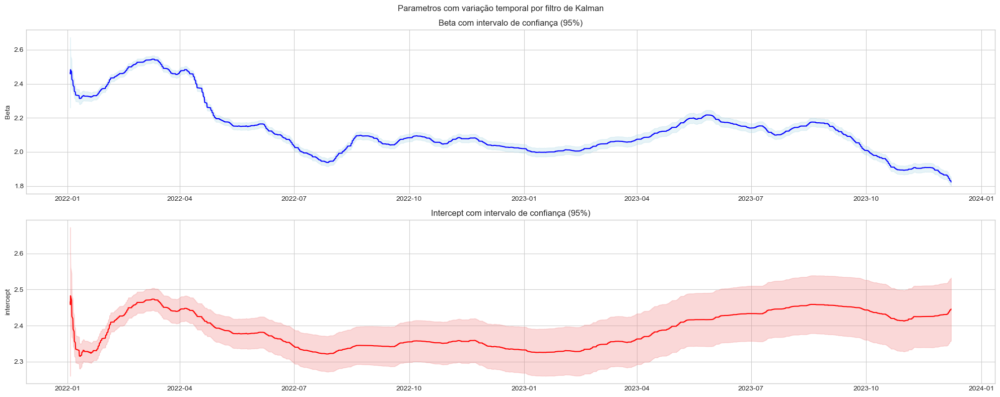

In [12]:
tickers = ['DMVF3.SA', 'PNVL3.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=90).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(60).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


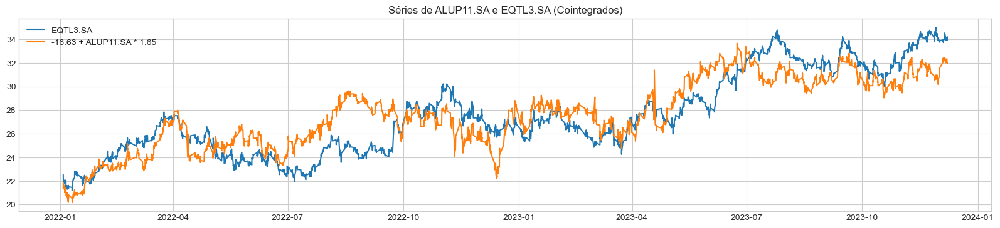

Formula do par: EQTL3.SA = -16.63 + 1.65 x ALUP11.SA


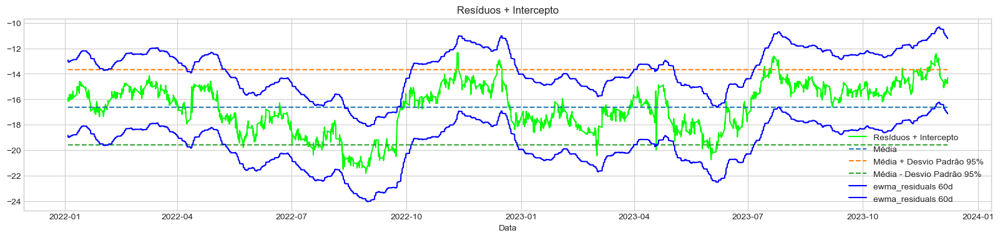

resíduo simples atual = -14.321728611320314
spread medio  = -16.63


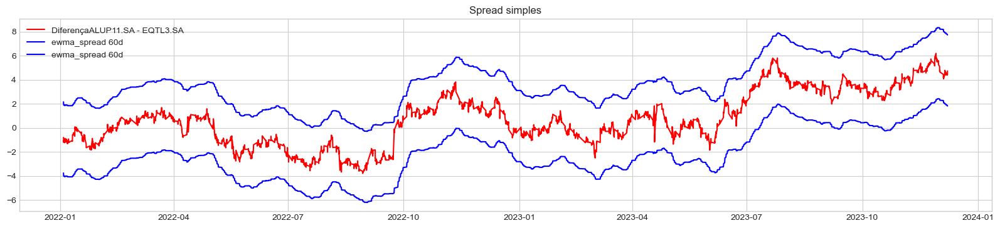

spread simples atual = 4.740001678466797
spread medio 90d = 5.097777875264486


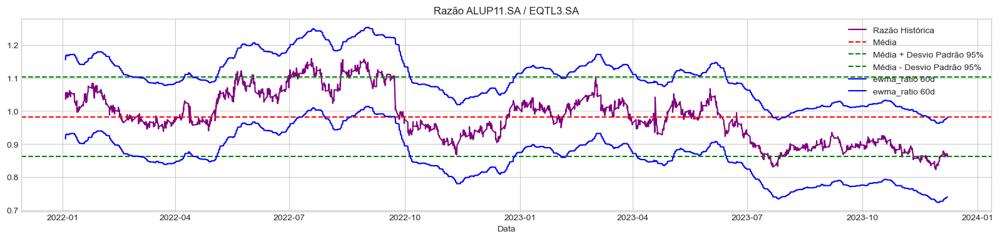

razão historica média é : 0.9827988283969177
razão historica atual é : 2023-12-07 17:00:00-03:00    0.861484
dtype: float64


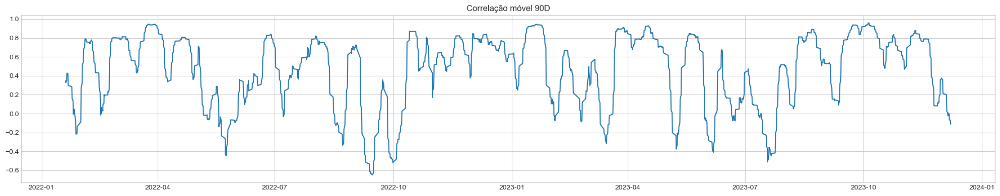

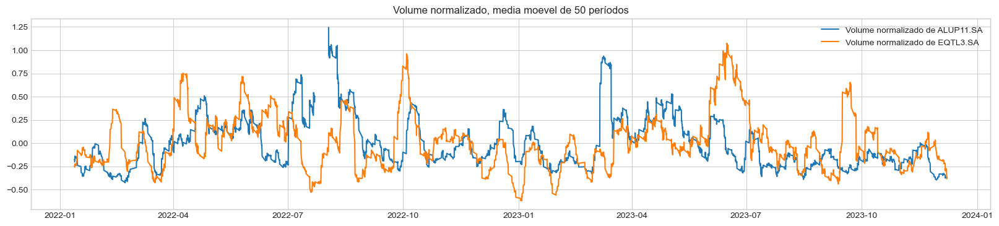

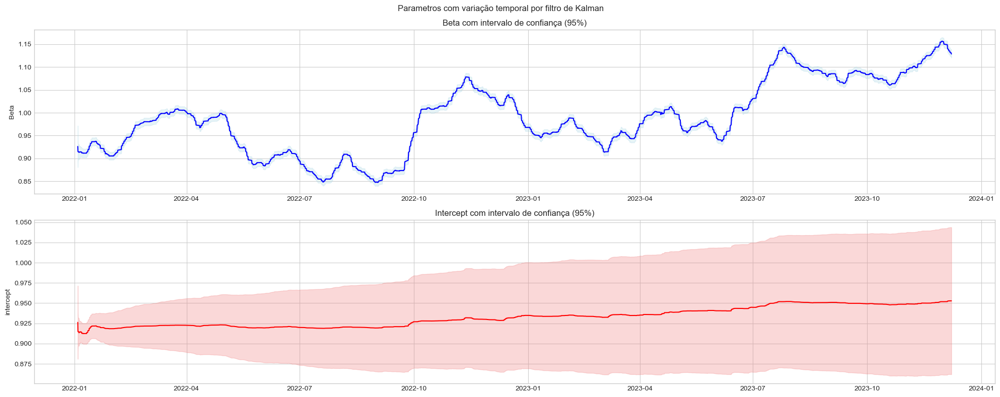

In [13]:
tickers = ['ALUP11.SA', 'EQTL3.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


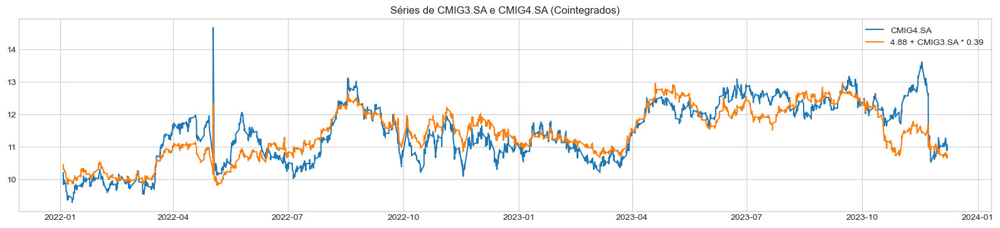

Formula do par: CMIG4.SA = 4.88 + 0.39 x CMIG3.SA


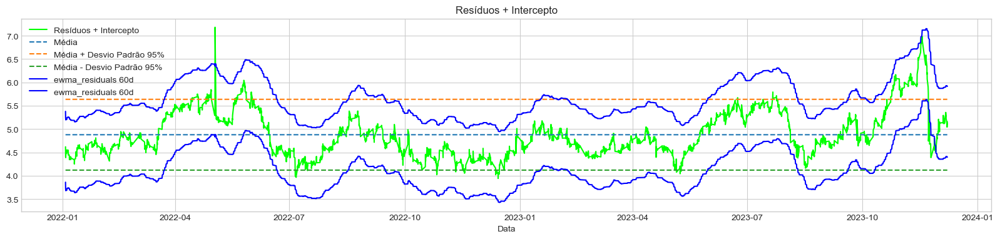

resíduo simples atual = 5.160830326968573
spread medio  = 4.88


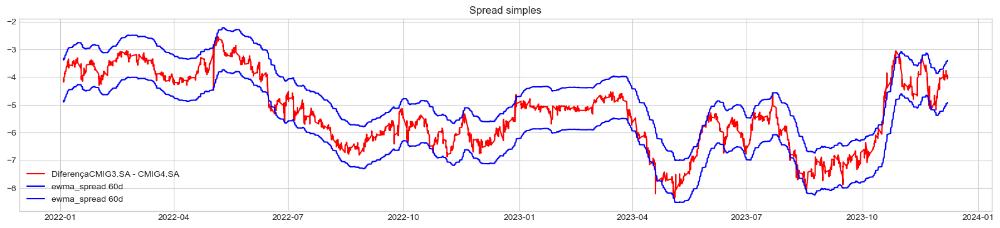

spread simples atual = -4.039999961853027
spread medio 90d = -4.427666717105442


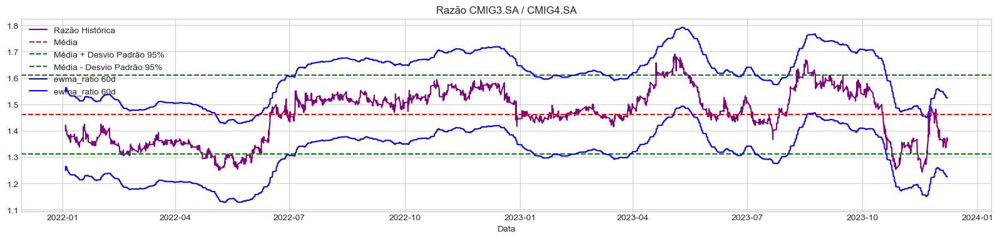

razão historica média é : 1.4620719599675007
razão historica atual é : 2023-12-07 17:00:00-03:00    1.36495
dtype: float64


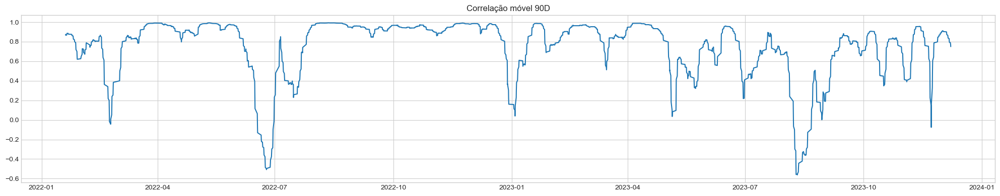

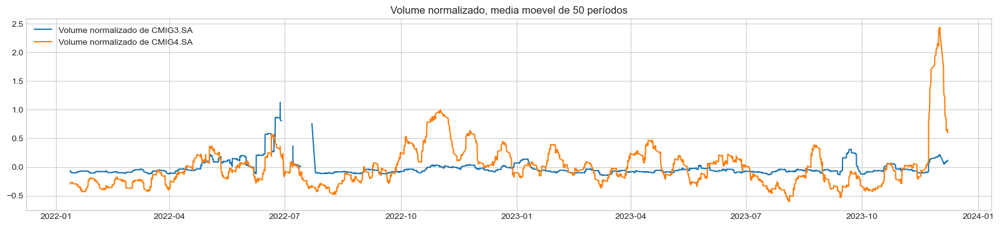

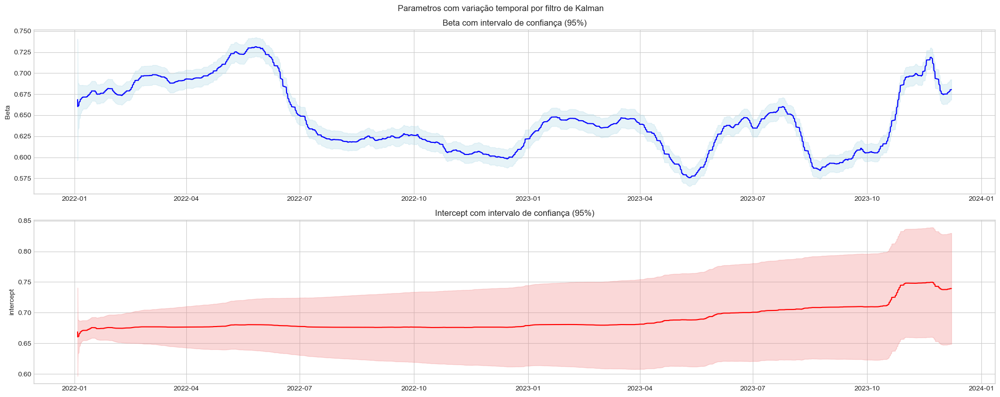

In [14]:
tickers = ['CMIG3.SA', 'CMIG4.SA']  

par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval='1h')['Volume']

# Realize o teste ADF nos resíduos para verificar a estacionariedade
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF

plt.figure(figsize=(20, 4))
plt.plot(par.index, par[tickers[1]], label=f'{tickers[1]}')
plt.plot(par.index, intercept + beta * par[tickers[0]], label=f'{intercept} + {tickers[0]} * {beta}')
plt.title(f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)')
plt.legend()
plt.grid(True)
plt.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}' )

plt.figure(figsize=(20, 4))
plt.plot(par.index, residuals+ intercept , label='Resíduos + Intercepto', color='lime')
med = residuals.mean() + intercept
std = (residuals).std() * 1.56
ewma_residuals = residuals.ewm(span=60).mean()
plt.plot(par.index, [med] * len(par), label='Média', linestyle='--')
plt.plot(par.index, [med + std] * len(par), label='Média + Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, [med - std] * len(par), label='Média - Desvio Padrão 95%', linestyle='--')
plt.plot(par.index, intercept + ewma_residuals + std, label='ewma_residuals 60d', color='blue')
plt.plot(par.index, intercept + ewma_residuals - std, label='ewma_residuals 60d', color='blue')
plt.title('Resíduos + Intercepto')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.show()
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept }')
print(f'spread medio  = {intercept}')


plt.figure(figsize=(20, 4))
plt.title('Spread simples')
spread = par[tickers[1]] - par[tickers[0]]
ewma_spread = spread.ewm(span=60).mean()
plt.plot(par.index, spread, label=f'Diferença{tickers[0]} - {tickers[1]}', color='r')
plt.plot(par.index, ewma_spread + std, label='ewma_spread 60d', color='blue')
plt.plot(par.index, ewma_spread - std, label='ewma_spread 60d', color='blue')
plt.legend()
plt.grid(True)
plt.show()
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')


historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=60).mean()
plt.figure(figsize=(20, 4))
plt.plot(historical_ratio, label='Razão Histórica', color='purple')
plt.axhline(historical_ratio_mean, color='r', linestyle='--', label='Média')
plt.axhline(historical_ratio_mean + historical_ratio_std, color='g', linestyle='--', label='Média + Desvio Padrão 95%')
plt.axhline(historical_ratio_mean - historical_ratio_std, color='g', linestyle='--', label='Média - Desvio Padrão 95%')
plt.plot(par.index, ewma_ratio + historical_ratio_std , label='ewma_ratio 60d', color='blue')
plt.plot(par.index, ewma_ratio - historical_ratio_std, label='ewma_ratio 60d', color='blue')
plt.xlabel('Data')
plt.legend()
plt.grid(True)
plt.title(f'Razão {tickers[0]} / {tickers[1]}')
plt.show()
print(f'razão historica média é : {historical_ratio_mean}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:]}')

rolling_correlation = par[tickers[1]].rolling(window=90).corr(par[tickers[0]])
plt.figure(figsize=(20, 4))
plt.plot(rolling_correlation)
plt.title('Correlação móvel 90D')
plt.grid(True)
plt.tight_layout()
plt.show()

normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean())/ par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean())/ par_v[tickers[1]].std()
plt.figure(figsize=(20, 4))
plt.plot(par_v.index, normalized0.rolling(50).mean(), label = f'Volume normalizado de {tickers[0]}')
plt.plot(par_v.index, normalized1.rolling(50).mean(), label = f'Volume normalizado de {tickers[1]}')
plt.title('Volume normalizado, media moevel de 50 períodos')
plt.legend()

# Realiza a filtragem de Kalman para obter as médias dos estados e suas covariâncias
state_means, state_covs = kf.filter(par[tickers[1]].values)

slope = state_means[:, 0]
intercept1 = state_means[:, 1]
slope_std = np.sqrt(state_covs[:, 0, 0])  # Desvio padrão do slope
intercept_std = np.sqrt(state_covs[:, 1, 1])  # Desvio padrão do intercept

# Plot dos coeficientes com intervalo de confiança
plt.figure(figsize=(20, 8))

# Plot do slope
plt.subplot(2, 1, 1)
plt.plot(par[tickers[1]].index, slope, c='b')
plt.fill_between(par[tickers[1]].index, slope - 1.56 * slope_std, slope + 1.56 * slope_std, alpha=0.3, color='lightblue')
plt.ylabel('Beta')
plt.suptitle('Parametros com variação temporal por filtro de Kalman')
plt.title('Beta com intervalo de confiança (95%)')

# Plot do intercept
plt.subplot(2, 1, 2)
plt.plot(par[tickers[1]].index, intercept1, c='r')
plt.fill_between(par[tickers[1]].index, intercept1 - 1.56 * intercept_std, intercept1 + 1.56 * intercept_std, alpha=0.3, color='lightcoral')
plt.ylabel('intercept')
plt.title('Intercept com intervalo de confiança (95%)')

plt.tight_layout()
plt.show()

Grafico interativo

In [95]:
tickers = ['TAEE3.SA' , 'TAEE11.SA']
datac = '2023-01-01' 
dataf = '2024-12-12'
intervalo = '1h'

ewma_residuals_param = 60
ewma_spread_param = 60
ewma_ratio_param = 60
rolling_correlation_param = 60
normalized_param = 60


par = pd.DataFrame()
par = yf.download(tickers, datac, dataf, interval=intervalo)['Adj Close']
par = par.dropna()

obs_mat = sm.add_constant(par[tickers[0]].values, prepend=False)[:, np.newaxis]
trans_cov = 1e-5 / (1 - 1e-5) * np.eye(2)

kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, 
                  initial_state_mean=np.ones(2),
                  initial_state_covariance=np.ones((2, 2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat,
                  observation_covariance=0.5,
                  transition_covariance=0.000001 * np.eye(2))


par_v = yf.download(tickers, datac, dataf, interval= intervalo)['Volume']

# ----------------------------------------------------------------------------------------------------------
X = sm.add_constant(par[tickers[0]])
y = par[tickers[1]]
model = sm.OLS(y, X).fit()
residuals = model.resid  #  resíduos 
beta = model.params[1].round(2)
intercept = model.params[0].round(2)                 
adf_result = adfuller(residuals)
p_value_adf = adf_result[1]  #  ADF
# -------------------------------------------------------------------------------------------------------------
fig = go.Figure()
fig.add_trace(go.Scatter(x=par.index, y=par[tickers[1]], mode='lines', name=f'{tickers[1]}'))
fig.add_trace(go.Scatter(x=par.index, y=intercept + beta * par[tickers[0]], mode='lines', name=f'{intercept} + {tickers[0]} * {beta}'))
fig.update_layout(
    title=f'Séries de {tickers[0]} e {tickers[1]} (Cointegrados)',
    xaxis=dict(title='Data'),
    yaxis=dict(title='Valor'),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='x',
    template='plotly_white'
)

fig.show()
print(f'Formula do par: {tickers[1]} = {intercept} + {beta} x {tickers[0]}')
# --------------------------------------------------------------------------------------------------------------------
med = residuals.mean() + intercept
std = residuals.std() * 1.56
ewma_residuals = residuals.ewm(span=ewma_residuals_param).mean()

plot_data = pd.DataFrame({
    'Date': par.index,
    'Residuals': residuals + intercept,
    'Mean': [med] * len(par),
    'Upper Bound': [med + std] * len(par),
    'Lower Bound': [med - std] * len(par),
    'EWMA + Std': intercept + ewma_residuals + std,
    'EWMA - Std': intercept + ewma_residuals - std
})

colors = {'Residuals': 'lime', 'Mean': 'red', 'Upper Bound': 'black', 'Lower Bound': 'black', 'EWMA + Std': 'blue', 'EWMA - Std': 'blue'}
fig = px.line(plot_data, x='Date', y=['Residuals', 'Mean', 'Upper Bound', 'Lower Bound', 'EWMA + Std', 'EWMA - Std'],
              labels={'value': 'Valor', 'variable': 'Variável', 'Date': 'Data'},
              title='Resíduos + Intercepto', color_discrete_map=colors)
fig.update_layout(
    xaxis=dict(title='Data'),
    yaxis=dict(title='Valor'),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='x',
    template='plotly_white'
)

fig.show()
print(f'Parametro do EWMA dos resíduos = {ewma_residuals_param}')
print(f'resíduo simples atual = {(residuals).iloc[-1] + intercept}')
print(f'spread medio  = {intercept}')
# ---------------------------------------------------------------------------------------------------------------------
spread = par[tickers[1]] - par[tickers[0]]
spread_std = spread.std() * 1.56
ewma_spread = spread.ewm(span=ewma_spread_param).mean()

spread_data = pd.DataFrame({
    'Date': par.index,
    'Spread': spread,
    'EWMA + Std': ewma_spread + spread_std,
    'EWMA - Std': ewma_spread - spread_std
})

colors = {'Spread': 'red', 'EWMA + Std': 'blue', 'EWMA - Std': 'blue'}
fig = px.line(spread_data, x='Date', y=['Spread', 'EWMA + Std', 'EWMA - Std'],
              labels={'value': 'Valor', 'variable': 'Variável', 'Date': 'Data'},
              title='Spread simples', color_discrete_map=colors)

fig.update_layout(
    xaxis=dict(title='Data'),
    yaxis=dict(title='Valor'),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='x',
    template='plotly_white'
)
fig.show()
print(f'Parametro do EWMA do sprea = {ewma_spread_param}')
print(f'spread simples atual = {(spread).iloc[-1]}')
print(f'spread medio 90d = {(spread.rolling(90).mean()).iloc[-1]}')

#--------------------------------------------------------------------------------------------------------------a
historical_ratio = par[tickers[0]] / par[tickers[1]]
historical_ratio_mean = historical_ratio.mean()
historical_ratio_std = historical_ratio.std() * 1.56
ewma_ratio = historical_ratio.ewm(span=ewma_ratio_param).mean()
ratio_data = pd.DataFrame({
    'Date': par.index,
    'Historical Ratio': historical_ratio,
    'EWMA Ratio + Std': ewma_ratio + historical_ratio_std,
    'EWMA Ratio - Std': ewma_ratio - historical_ratio_std
})

colors = {'Historical Ratio': 'purple', 'EWMA Ratio + Std': 'blue', 'EWMA Ratio - Std': 'blue'}
fig = px.line(ratio_data, x='Date', y=['Historical Ratio', 'EWMA Ratio + Std', 'EWMA Ratio - Std'],
              labels={'value': 'Valor', 'variable': 'Variável', 'Date': 'Data'},
              title=f'Razão {tickers[0]} / {tickers[1]}',  color_discrete_map=colors)

fig.add_hline(y=historical_ratio_mean, line_dash='dash', line_color='green', annotation_text=f'Média: {historical_ratio_mean.round(3)}',
              annotation_position='bottom right')
fig.add_hline(y=historical_ratio_mean + historical_ratio_std, line_dash='dash', line_color='red',
              annotation_text=f'Média + Desvio Padrão: {(historical_ratio_mean+ historical_ratio_std).round(3)}',
              annotation_position='bottom right')
fig.add_hline(y=historical_ratio_mean - historical_ratio_std, line_dash='dash', line_color='orange',
              annotation_text=f'Média - Desvio Padrão: {(historical_ratio_mean - historical_ratio_std).round(3)}',
              annotation_position='bottom right')

fig.update_layout(
    xaxis=dict(title='Data'),
    yaxis=dict(title='Valor'),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='x',
    template='plotly_white')
fig.show()
print(f'Parametro do EWMA do ratio = {ewma_ratio_param}')
print(f'razão historica média é : {historical_ratio_mean.round(2)}')
print(f'razão historica atual é : {(historical_ratio).iloc[-1:].round(2)}')
# -----------------------------------------------------------------------------------------------------
rolling_correlation = par[tickers[1]].rolling(window=rolling_correlation_param).corr(par[tickers[0]])
correlation_data = pd.DataFrame({'Date': par.index, 'Rolling Correlation': rolling_correlation})
fig = px.line(correlation_data, x='Date', y='Rolling Correlation',
              labels={'Rolling Correlation': 'Correlação Móvel', 'Date': 'Data'},
              title=f'Correlação móvel {rolling_correlation_param} dias')

fig.update_layout(
    xaxis=dict(title='Data'),
    yaxis=dict(title='Correlação'),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='x',
    template='plotly_white'
)

fig.show()
# ---------------------------------------------------------------------------------------------------------------
normalized0 = (par_v[tickers[0]] - par_v[tickers[0]].mean()) / par_v[tickers[0]].std()
normalized1 = (par_v[tickers[1]] - par_v[tickers[1]].mean()) / par_v[tickers[1]].std()
normalized_data = pd.DataFrame({
    'Date': par_v.index,
    'Volume normalizado de ' + tickers[0]: normalized0.rolling(normalized_param).mean(),
    'Volume normalizado de ' + tickers[1]: normalized1.rolling(normalized_param).mean()
})

fig = px.line(normalized_data, x='Date', y=normalized_data.columns[1:],
              labels={'value': 'Volume Normalizado', 'Date': 'Data'},
              title=f'Volume normalizado, média móvel de {normalized_param} períodos')

fig.update_layout(
    xaxis=dict(title='Data'),
    yaxis=dict(title='Volume Normalizado'),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='x',
    template='plotly_white'
)

fig.show()
#-------------------------------------------------------------------------------------------
fig_slope_kalman = go.Figure()

fig_slope_kalman.add_trace(go.Scatter(x=par[tickers[1]].index, y=slope, mode='lines', name='Slope', line=dict(color='blue')))
fig_slope_kalman.add_trace(go.Scatter(x=par[tickers[1]].index, y=slope - 1.56 * slope_std, mode='lines', name='Lower Bound', line=dict(color='lightblue')))
fig_slope_kalman.add_trace(go.Scatter(x=par[tickers[1]].index, y=slope + 1.56 * slope_std, mode='lines', name='Upper Bound', line=dict(color='lightblue')))

fig_slope_kalman.add_trace(go.Scatter(
    x=list(par[tickers[1]].index) + list(par[tickers[1]].index)[::-1],
    y=list(slope + 1.56 * slope_std) + list((slope - 1.56 * slope_std))[::-1],
    fill='toself',
    fillcolor='rgba(173, 216, 230, 0.4)',
    line=dict(color='rgba(255, 255, 255, 0)'),
    name='Confidence Interval'
))

fig_slope_kalman.update_layout(
    title='Beta com intervalo de confiança (95%)',
    xaxis_title='Data',
    yaxis_title='Beta',
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='x',
    template='plotly_white'
)
fig_slope_kalman.show()
fig_intercept_kalman = go.Figure()

#---------------------------------------------------------------------------------------------------------------------------
fig_intercept_kalman.add_trace(go.Scatter(x=par[tickers[1]].index, y=intercept1, mode='lines', name='Intercept', line=dict(color='red')))
fig_intercept_kalman.add_trace(go.Scatter(x=par[tickers[1]].index, y=intercept1 - 1.56 * intercept_std, mode='lines', name='Lower Bound', line=dict(color='lightcoral')))
fig_intercept_kalman.add_trace(go.Scatter(x=par[tickers[1]].index, y=intercept1 + 1.56 * intercept_std, mode='lines', name='Upper Bound', line=dict(color='lightcoral')))
fig_intercept_kalman.add_trace(go.Scatter(
    x=list(par[tickers[1]].index) + list(par[tickers[1]].index)[::-1],
    y=list(intercept1 + 1.56 * intercept_std) + list((intercept1 - 1.56 * intercept_std))[::-1],
    fill='toself',
    fillcolor='rgba(240, 128, 128, 0.4)',
    line=dict(color='rgba(255, 255, 255, 0)'),
    name='Confidence Interval'
))

fig_intercept_kalman.update_layout(
    title='Intercept com intervalo de confiança (95%)',
    xaxis_title='Data',
    yaxis_title='Intercept',
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode='x',
    template='plotly_white'
)
fig_intercept_kalman.show()


[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


Formula do par: TAEE11.SA = 0.07 + 3.0 x TAEE3.SA


Parametro do EWMA dos resíduos = 60
resíduo simples atual = -0.014386424763373207
spread medio  = 0.07


Parametro do EWMA do sprea = 60
spread simples atual = 23.970001220703125
spread medio 90d = 24.35844438340929


Parametro do EWMA do ratio = 60
razão historica média é : 0.33
razão historica atual é : 2023-12-07 17:00:00-03:00    0.33
dtype: float64


In [91]:
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller
import yfinance as yf
import statsmodels.api as sm
tickers_list = [ ['CYRE3.SA', 'MDNE3.SA'], ['CURY3.SA', 'DIRR3.SA'], ['TASA3.SA', 'TASA4.SA'],
               ['EVEN3.SA', 'TRIS3.SA'], ['MELK3.SA', 'CYRE3.SA'], ['MTRE3.SA', 'MRVE3.SA'], ['TRIS3.SA', 'EVEN3.SA'],
                ['DMVF3.SA', 'PNVL3.SA'], ['SANB11.SA', 'SANB4.SA'], ['SANB3.SA', 'SANB4.SA'], ['CMIG3.SA', 'CMIG4.SA'],
               ['EGIE3.SA', 'ALUP11.SA'], ['ALUP11.SA', 'EQTL3.SA'], ['TAEE3.SA', 'TAEE11.SA'], ['SAPR11.SA', 'SAPR4.SA']]  # Adicione seus pares cointegrados aqui
data = []

for tickers in tickers_list:
    par = pd.DataFrame()
    par = yf.download(tickers, '2021-01-01', '2023-12-31', interval='1d')['Adj Close']
    par = par.dropna()
    X = sm.add_constant(par[tickers[0]])
    y = par[tickers[1]]
    model = sm.OLS(y, X).fit()
    residuals = model.resid
    beta = model.params[1].round(2)
    intercept = model.params[0].round(2)
    adf_result = adfuller(residuals)
    p_value_adf = adf_result[1] 
    med = residuals.mean() + intercept
    std = residuals.std()
    lower_bound_90 = med - (1.645 * std)
    upper_bound_90 = med + (1.645 * std)    
    lower_bound_95 = med - 1.960 * std
    upper_bound_95 = med + 1.960 * std  
    lower_bound_98 = med - 2.33 * std
    upper_bound_98 = med + 2.33 * std
    lower_bound_99 = med - 2.576 * std
    upper_bound_99 = med + 2.576 * std
    result_90 = '90% - Aguardar' if lower_bound_90 <= residuals.iloc[-1] <= upper_bound_90 else '90% - Oportunidade'
    result_95 = '95% - Aguardar' if lower_bound_95 <= residuals.iloc[-1] <= upper_bound_95 else '95% - Oportunidade'
    result_98 = '98% - Aguardar' if lower_bound_98 <= residuals.iloc[-1] <= upper_bound_98 else '98% - Oportunidade'
    result_99 = '99% - Aguardar' if lower_bound_99 <= residuals.iloc[-1] <= upper_bound_99 else '99% - Oportunidade'

    data.append([result_90, result_95, result_98, result_99])

columns = ['90%', '95%', '98%', '99%']
df = pd.DataFrame(data, columns=columns)
df.index = [f'{tickers[0]} e {tickers[1]}' for tickers in tickers_list]
df


[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%********

,90%,95%,98%,99%
CYRE3.SA e MDNE3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
CURY3.SA e DIRR3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
TASA3.SA e TASA4.SA,90% - Oportunidade,95% - Aguardar,98% - Aguardar,99% - Aguardar
EVEN3.SA e TRIS3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
MELK3.SA e CYRE3.SA,90% - Oportunidade,95% - Oportunidade,98% - Aguardar,99% - Aguardar
MTRE3.SA e MRVE3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
TRIS3.SA e EVEN3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
DMVF3.SA e PNVL3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
SANB11.SA e SANB4.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
SANB3.SA e SANB4.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade


In [90]:
tickers_list = [ ['CYRE3.SA', 'MDNE3.SA'], ['CURY3.SA', 'DIRR3.SA'], ['TASA3.SA', 'TASA4.SA'],
               ['EVEN3.SA', 'TRIS3.SA'], ['MELK3.SA', 'CYRE3.SA'], ['MTRE3.SA', 'MRVE3.SA'], ['TRIS3.SA', 'EVEN3.SA'],
                ['DMVF3.SA', 'PNVL3.SA'], ['SANB11.SA', 'SANB4.SA'], ['SANB3.SA', 'SANB4.SA'], ['CMIG3.SA', 'CMIG4.SA'],
               ['EGIE3.SA', 'ALUP11.SA'], ['ALUP11.SA', 'EQTL3.SA'], ['TAEE3.SA', 'TAEE11.SA'], ['SAPR11.SA', 'SAPR4.SA']]  # Adicione seus pares cointegrados aqui
data = []

for tickers in tickers_list:
    par = pd.DataFrame()
    par = yf.download(tickers, '2023-01-01', '2023-12-31', interval='1h')['Adj Close']
    par = par.dropna()
    X = sm.add_constant(par[tickers[0]])
    y = par[tickers[1]]
    model = sm.OLS(y, X).fit()
    residuals = model.resid 
    beta = model.params[1].round(2)
    intercept = model.params[0].round(2)
    adf_result = adfuller(residuals)
    p_value_adf = adf_result[1] 

    med = residuals.mean() + intercept
    std = residuals.std()
    lower_bound_90 = med - (1.645 * std)
    upper_bound_90 = med + (1.645 * std)  
    lower_bound_95 = med - 1.960 * std
    upper_bound_95 = med + 1.960 * std   
    lower_bound_98 = med - 2.33 * std
    upper_bound_98 = med + 2.33 * std
    lower_bound_99 = med - 2.576 * std
    upper_bound_99 = med + 2.576 * std   
    result_90 = '90% - Aguardar' if lower_bound_90 <= residuals.iloc[-1] <= upper_bound_90 else '90% - Oportunidade'
    result_95 = '95% - Aguardar' if lower_bound_95 <= residuals.iloc[-1] <= upper_bound_95 else '95% - Oportunidade'
    result_98 = '98% - Aguardar' if lower_bound_98 <= residuals.iloc[-1] <= upper_bound_98 else '98% - Oportunidade'
    result_99 = '99% - Aguardar' if lower_bound_99 <= residuals.iloc[-1] <= upper_bound_99 else '99% - Oportunidade'

    data.append([result_90, result_95, result_98, result_99])


columns = ['90%', '95%', '98%', '99%']
df = pd.DataFrame(data, columns=columns)
df.index = [f'{tickers[0]} e {tickers[1]}' for tickers in tickers_list]
df



[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed
[*********************100%********

,90%,95%,98%,99%
CYRE3.SA e MDNE3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
CURY3.SA e DIRR3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
TASA3.SA e TASA4.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
EVEN3.SA e TRIS3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
MELK3.SA e CYRE3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
MTRE3.SA e MRVE3.SA,90% - Aguardar,95% - Aguardar,98% - Aguardar,99% - Aguardar
TRIS3.SA e EVEN3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
DMVF3.SA e PNVL3.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
SANB11.SA e SANB4.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade
SANB3.SA e SANB4.SA,90% - Oportunidade,95% - Oportunidade,98% - Oportunidade,99% - Oportunidade


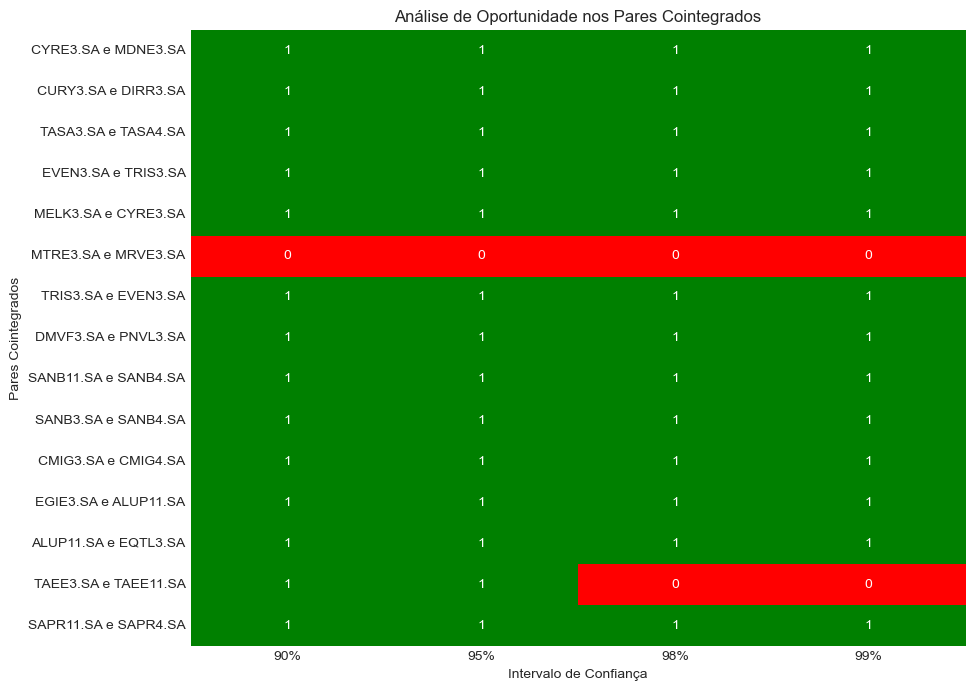

In [86]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
import yfinance as yf
import statsmodels.api as sm

convert_to_numeric = lambda x: 0 if x == '90% - Aguardar' or x == '95% - Aguardar' or x == '98% - Aguardar' or x == '99% - Aguardar' else 1


df_numeric = df.applymap(convert_to_numeric)

plt.figure(figsize=(10, 8))
sns.heatmap(df_numeric, cmap=['red', 'green'], annot=True, fmt='d', cbar=False)
plt.title('Análise de Oportunidade nos Pares Cointegrados')
plt.xlabel('Intervalo de Confiança')
plt.ylabel('Pares Cointegrados')
plt.show()
